1

## Packaged needed for this network
### - this will take a while ~7-10 mins


In [13]:
%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu124 -q

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 26.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [14]:
%pip install torch torchvision opencv-python matplotlib scikit-learn pandas tqdm onnx onnxruntime

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 26.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [15]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from collections import Counter

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from torchvision.models import mobilenet_v3_small, MobileNet_V3_Small_Weights
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tqdm.notebook import tqdm

check for GPU 

In [16]:
print(torch.__version__)
print(torch.cuda.is_available())
print(torch.version.cuda)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"using {DEVICE}")
if torch.cuda.is_available():
     print(f"GPU          : {torch.cuda.get_device_name(0)}")

2.6.0+cu124
True
12.4
using cuda
GPU          : NVIDIA GeForce RTX 4070


# PATHS

In [17]:
# Paths 
DATASET_ROOT = Path(r"C:/Users/Nils/Downloads/dataset/dataset")
OBJECTS_DIR  = DATASET_ROOT / "objects"      # Cropped shapes for training
MASKED_DIR   = DATASET_ROOT / "masked"       # Full scenes for inference testing
LABELS_CSV   = DATASET_ROOT / "labels.csv"

# 5 Real Physical Classes 
VALID_CLASSES = ["Circle", "Hexagon", "Square", "Star", "Triangle"]

classes = sorted(VALID_CLASSES)
CLASS_TO_IDX = {name: i for i, name in enumerate(classes)}
IDX_TO_CLASS = {i: name for name, i in CLASS_TO_IDX.items()}

print(f"Active classes ({len(classes)}):")
for idx, name in IDX_TO_CLASS.items():
    print(f"  [{idx}] {name}")

Active classes (5):
  [0] Circle
  [1] Hexagon
  [2] Square
  [3] Star
  [4] Triangle


Collect pairs

In [18]:
#  Collect all valid pairs
samples = []

for folder in OBJECTS_DIR.iterdir():
    if not folder.is_dir() or folder.name not in CLASS_TO_IDX:
        continue  # skip Rectangles, Polygons, etc.
        
    label_idx = CLASS_TO_IDX[folder.name]
    for img_path in folder.glob("*.png"):
        samples.append((str(img_path), label_idx))

print(f"Clean training dataset: {len(samples)} total images\n")

counts = Counter(IDX_TO_CLASS[idx] for _, idx in samples)
for name, count in sorted(counts.items()):
    print(f"{name:<12} : {count:>3} images")

Clean training dataset: 190 total images

Circle       :  13 images
Hexagon      :  37 images
Square       :  32 images
Star         :  59 images
Triangle     :  49 images


In [19]:
paths  = [s[0] for s in samples]
labels  = [s[1] for s in samples]

train_paths,val_paths, train_labels,val_labels = train_test_split(
    paths,
    labels,
    test_size=0.20,
    random_state=42,
    stratify=labels, # this ensures that all calsses are represented in both sets 

)

print(f"Training set   : {len(train_paths)} images")
print(f"Validation set : {len(val_paths)} images")

Training set   : 152 images
Validation set : 38 images


Data augmentation and image transformation

In [20]:
IMG_SIZE = 128
train_transform = T.Compose([
    T.ToPILImage(),
    T.Resize((IMG_SIZE,IMG_SIZE)),
    T.RandomRotation(degrees=180),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.5),
    T.RandomAffine(
        degrees=0,
        translate=(0.05,0.05), # small pixel shift
        scale=(0.8,1.1), # slight zoom in and out
    ),
    T.ColorJitter(brightness=0.2,contrast=0.2), # this simulates lighting changes 
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456,0.406],  # standard imageNet
                std=[0.299,0.224,0.225]
    ), 
])

# Validation Transforms 
val_transform = T.Compose([
    T.ToPILImage(),
    T.Resize((IMG_SIZE,IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], 
                std=[0.229, 0.224, 0.225]),
])

print("Transforms success")

Transforms success


Dataset and dataloader

In [21]:
class ShapeDataset(Dataset):
    """ loads shape crops from disk and applies OTF transofrmations """
    def __init__(self,paths,labels, transform=None):
        self.paths = paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.paths)
    
    def __getitem__(self, idx):
        # read image with openCV
        img_bgr = cv2.imread(self.paths[idx])
        if img_bgr is None:
            raise FileNotFoundError(f"could not load file : {self.paths[idx]}")

        # covert image to RGB bc torchvision want it 
        img_rbg = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # apply the augs from earlier 
        if self.transform:
            img_rbg = self.transform(img_rbg)
        labels = torch.tensor(self.labels[idx], dtype=torch.long)
        return img_rbg, labels


# dataset loader
BATCH_SIZE = 16

train_dataset = ShapeDataset(train_paths,
                             train_labels,
                               transform=train_transform
                               )
val_dataset = ShapeDataset(val_paths,
                           val_labels,
                           transform=val_transform
                           )

train_loader = DataLoader(train_dataset,
                          batch_size=BATCH_SIZE,
                          shuffle=True,
                          num_workers=0
                          )
val_loader = DataLoader(val_dataset,
                        batch_size=BATCH_SIZE,
                        shuffle=True,
                        num_workers=0
                        )



sample_imgs, sample_lbls = next(iter(train_loader))
print(f"Batch image tensor shape: {sample_imgs.shape}  (Batch size, Channels, Height, Width)")
print(f"Batch labels sample:      {sample_lbls.tolist()[:8]}") 

Batch image tensor shape: torch.Size([16, 3, 128, 128])  (Batch size, Channels, Height, Width)
Batch labels sample:      [4, 3, 3, 3, 2, 3, 3, 2]


## Model Time MobileNetV3


https://medium.com/@RobuRishabh/understanding-and-implementing-mobilenetv3-422bd0bdfb5a

In [22]:
def build_model(num_classes:int,freeze_backbone:bool = True) -> nn.Module:
    """
    MobileNetV3, is apperantly cutting-edge architecture for efficient deep learning 
    models designed for mobile devices.
    Good for mobile units or arms CPUs
    """
    # load weights 
    weights = MobileNet_V3_Small_Weights.IMAGENET1K_V1
    model = mobilenet_v3_small(weights=weights)

    # freze the backbone layers 
    if freeze_backbone:
        for param in model.features.parameters():
            param.requires_grad = False

    # replace thr final clasifer layer 1024 features -> num clases 
    in_features = model.classifier[3].in_features 
    model.classifier[3] = nn.Linear(in_features, num_classes)
    return model



model = build_model(num_classes=len(classes), freeze_backbone=True)
model = model.to(DEVICE)
# Check parameter count
total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total model parameters    : {total_params:,}")
print(f"Trainable parameters now  : {trainable_params:,}  ({100 * trainable_params / total_params:.2f}%)")
print(f"Model successfully placed on: {DEVICE}")


Total model parameters    : 1,522,981
Trainable parameters now  : 595,973  (39.13%)
Model successfully placed on: cuda


Loss and optimizer

In [23]:
criterion = nn.CrossEntropyLoss()

def run_epoch(model,loader,is_train:bool, optimizer=None):
    model.train() if is_train else model.eval()

    total_loss, correct, total = 0.0, 0, 0
    ctx = torch.enable_grad() if is_train else torch.no_grad()

    with ctx:
        for imgs,labels in loader:
            imgs,labels = imgs.to(DEVICE), labels.to(DEVICE)

            if is_train:
                optimizer.zero_grad()

            logits = model(imgs)
            loss = criterion(logits,labels)

            if is_train:
                loss.backward()
                optimizer.step()
            total_loss += loss.item()*imgs.size(0)
            preds = logits.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += imgs.size(0)
    return total_loss / total, correct / total



def train_model(model, n_epochs: int, lr: float = 1e-3):
    """Trains the model and saves the best checkpoint based on validation accuracy."""
    optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=lr)
    best_acc  = 0.0
    
    print(f"Starting training for {n_epochs} epochs on {DEVICE}...")
    print("-" * 55)
    
    for epoch in range(1, n_epochs + 1):
        tr_loss, tr_acc = run_epoch(model, train_loader, is_train=True, optimizer=optimizer)
        vl_loss, vl_acc = run_epoch(model, val_loader,   is_train=False)
        
        saved = ""
        if vl_acc > best_acc:
            best_acc = vl_acc
            torch.save(model.state_dict(), "best_shape_cnn.pth")
            saved = "(Saved best checkpoint!)"
            
        print(f"Epoch [{epoch:02d}/{n_epochs:02d}] | "
              f"Train Acc: {tr_acc * 100:5.1f}% | "
              f"Val Acc: {vl_acc * 100:5.1f}% | "
              f"Val Loss: {vl_loss:.4f} {saved}")
    print("-" * 55)
    print(f"Training Complete! Peak Validation Accuracy: {best_acc * 100:.1f}%")

# run for 15 epochs
train_model(model, n_epochs=50, lr=1e-3)

Starting training for 50 epochs on cuda...
-------------------------------------------------------
Epoch [01/50] | Train Acc:  67.8% | Val Acc:  71.1% | Val Loss: 0.8742 (Saved best checkpoint!)
Epoch [02/50] | Train Acc:  91.4% | Val Acc:  57.9% | Val Loss: 0.7594 
Epoch [03/50] | Train Acc:  96.1% | Val Acc:  57.9% | Val Loss: 0.6846 
Epoch [04/50] | Train Acc:  84.9% | Val Acc:  60.5% | Val Loss: 0.5791 
Epoch [05/50] | Train Acc:  95.4% | Val Acc:  94.7% | Val Loss: 0.2726 (Saved best checkpoint!)
Epoch [06/50] | Train Acc:  98.0% | Val Acc:  94.7% | Val Loss: 0.2937 
Epoch [07/50] | Train Acc:  95.4% | Val Acc:  92.1% | Val Loss: 0.3103 
Epoch [08/50] | Train Acc:  94.1% | Val Acc:  97.4% | Val Loss: 0.2436 (Saved best checkpoint!)
Epoch [09/50] | Train Acc:  95.4% | Val Acc:  97.4% | Val Loss: 0.1498 
Epoch [10/50] | Train Acc:  96.1% | Val Acc:  97.4% | Val Loss: 0.1672 
Epoch [11/50] | Train Acc:  95.4% | Val Acc:  97.4% | Val Loss: 0.1079 
Epoch [12/50] | Train Acc:  98.7% | V

              precision    recall  f1-score   support

      Circle       1.00      1.00      1.00         3
     Hexagon       1.00      1.00      1.00         7
      Square       1.00      1.00      1.00         6
        Star       1.00      1.00      1.00        12
    Triangle       1.00      1.00      1.00        10

    accuracy                           1.00        38
   macro avg       1.00      1.00      1.00        38
weighted avg       1.00      1.00      1.00        38



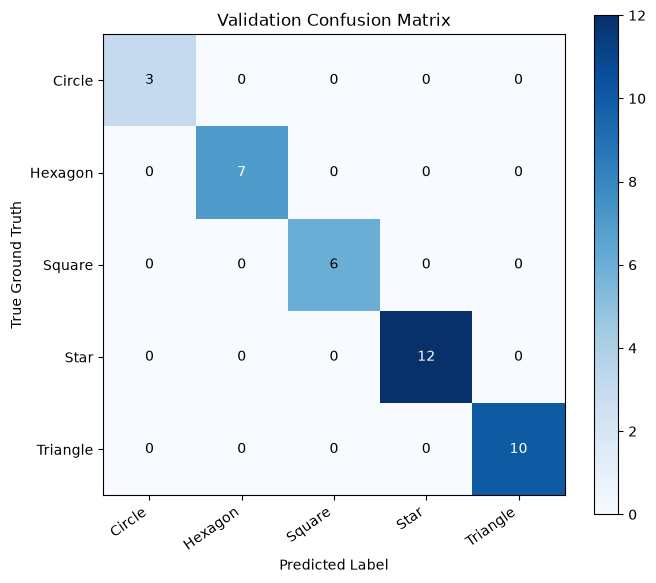

In [24]:
# ── Load best saved weights ───────────────────────────────────────────────────
model.load_state_dict(torch.load("best_shape_cnn.pth", map_location=DEVICE))
model.eval()

all_preds  = []
all_labels = []

with torch.no_grad():
    for imgs, labels in val_loader:
        imgs   = imgs.to(DEVICE)
        logits = model(imgs)
        preds  = logits.argmax(dim=1).cpu().tolist()
        
        all_preds.extend(preds)
        all_labels.extend(labels.tolist())

# ── Print Precision, Recall, F1 ───────────────────────────────────────────────
print(classification_report(
    all_labels, 
    all_preds, 
    target_names=classes,
    zero_division=0
))

# ── Plot Visual Confusion Matrix ──────────────────────────────────────────────
cm = confusion_matrix(all_labels, all_preds)
fig, ax = plt.subplots(figsize=(7, 6))
im = ax.imshow(cm, cmap="Blues")
plt.colorbar(im, ax=ax)

ax.set_xticks(range(len(classes)))
ax.set_yticks(range(len(classes)))
ax.set_xticklabels(classes, rotation=35, ha="right")
ax.set_yticklabels(classes)
ax.set_xlabel("Predicted Label")
ax.set_ylabel("True Ground Truth")
ax.set_title("Validation Confusion Matrix")

# Draw numbers in each cell
for i in range(len(classes)):
    for j in range(len(classes)):
        ax.text(j, i, str(cm[i, j]), ha="center", va="center",
                color="white" if cm[i, j] > cm.max() / 2 else "black")

plt.tight_layout()
plt.show()

In [25]:
# ── Phase 2: Unfreeze the Backbone ────────────────────────────────────────────
for param in model.features.parameters():
    param.requires_grad = True

trainable_after = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Trainable parameters now: {trainable_after:,} (100% of network is learning!)")

# ── Fine-tune with a gentle learning rate (1e-4) for 15 epochs ───────────────
train_model(model, n_epochs=15, lr=1e-4)

Trainable parameters now: 1,522,981 (100% of network is learning!)
Starting training for 15 epochs on cuda...
-------------------------------------------------------
Epoch [01/15] | Train Acc:  94.7% | Val Acc:  97.4% | Val Loss: 0.0910 (Saved best checkpoint!)
Epoch [02/15] | Train Acc:  96.7% | Val Acc:  97.4% | Val Loss: 0.0934 
Epoch [03/15] | Train Acc:  96.7% | Val Acc:  97.4% | Val Loss: 0.0566 
Epoch [04/15] | Train Acc:  95.4% | Val Acc:  97.4% | Val Loss: 0.0509 
Epoch [05/15] | Train Acc:  98.7% | Val Acc:  97.4% | Val Loss: 0.0631 
Epoch [06/15] | Train Acc:  97.4% | Val Acc:  97.4% | Val Loss: 0.0629 
Epoch [07/15] | Train Acc:  99.3% | Val Acc:  97.4% | Val Loss: 0.0582 
Epoch [08/15] | Train Acc: 100.0% | Val Acc:  97.4% | Val Loss: 0.0490 
Epoch [09/15] | Train Acc: 100.0% | Val Acc: 100.0% | Val Loss: 0.0397 (Saved best checkpoint!)
Epoch [10/15] | Train Acc: 100.0% | Val Acc: 100.0% | Val Loss: 0.0241 
Epoch [11/15] | Train Acc:  98.0% | Val Acc: 100.0% | Val Loss: 0.

              precision    recall  f1-score   support

      Circle       1.00      1.00      1.00         3
     Hexagon       1.00      1.00      1.00         7
      Square       1.00      1.00      1.00         6
        Star       1.00      1.00      1.00        12
    Triangle       1.00      1.00      1.00        10

    accuracy                           1.00        38
   macro avg       1.00      1.00      1.00        38
weighted avg       1.00      1.00      1.00        38



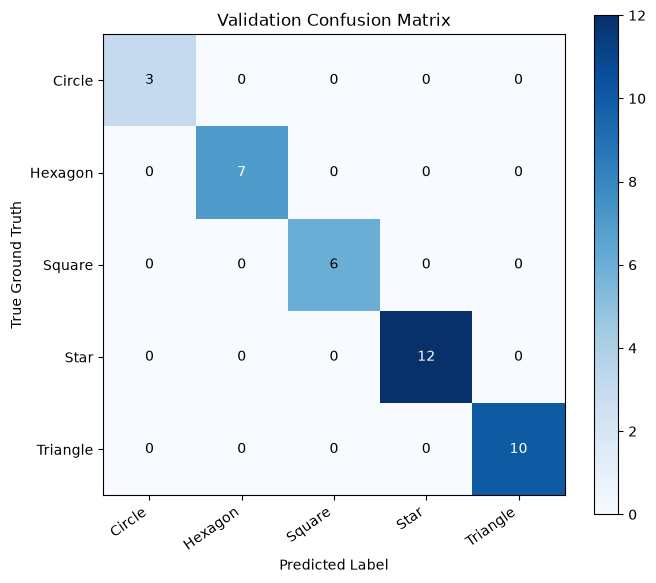

In [26]:
# ── Load best saved weights ───────────────────────────────────────────────────
model.load_state_dict(torch.load("best_shape_cnn.pth", map_location=DEVICE))
model.eval()

all_preds  = []
all_labels = []

with torch.no_grad():
    for imgs, labels in val_loader:
        imgs   = imgs.to(DEVICE)
        logits = model(imgs)
        preds  = logits.argmax(dim=1).cpu().tolist()
        
        all_preds.extend(preds)
        all_labels.extend(labels.tolist())

# ── Print Precision, Recall, F1 ───────────────────────────────────────────────
print(classification_report(
    all_labels, 
    all_preds, 
    target_names=classes,
    zero_division=0
))

# ── Plot Visual Confusion Matrix ──────────────────────────────────────────────
cm = confusion_matrix(all_labels, all_preds)
fig, ax = plt.subplots(figsize=(7, 6))
im = ax.imshow(cm, cmap="Blues")
plt.colorbar(im, ax=ax)

ax.set_xticks(range(len(classes)))
ax.set_yticks(range(len(classes)))
ax.set_xticklabels(classes, rotation=35, ha="right")
ax.set_yticklabels(classes)
ax.set_xlabel("Predicted Label")
ax.set_ylabel("True Ground Truth")
ax.set_title("Validation Confusion Matrix")

# Draw numbers in each cell
for i in range(len(classes)):
    for j in range(len(classes)):
        ax.text(j, i, str(cm[i, j]), ha="center", va="center",
                color="white" if cm[i, j] > cm.max() / 2 else "black")

plt.tight_layout()
plt.show()

In [27]:
def detect_shape_regions(
    img_bgr: np.ndarray, 
    min_area: int = 2500,       # Ignore tiny noise / dust
    max_area: int = 25000,      # Anything bigger is a CLUSTER of multiple pieces!
    max_perimeter: int = 800,   # Single piece perimeter limit
    threshold: int = 25, 
    pad: int = 10
):
    """
    Finds isolated single-piece contours and centroids.
    - Rejects boundary cut-off pieces
    - Rejects clusters/jams where multiple shapes touch
    """
    H, W = img_bgr.shape[:2]
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask   = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    regions = []
    for cnt in contours:
        area  = cv2.contourArea(cnt)
        perim = cv2.arcLength(cnt, True)
        
        # Reject noise (too small)
        if area < min_area:
            continue
            
        x, y, w, h = cv2.boundingRect(cnt)
        
        # Reject frame border cutoffs
        if x <= 2 or y <= 2 or (x + w) >= (W - 2) or (y + h) >= (H - 2):
            continue
            
        # Reject CLUSTERS (multiple touching shapes)
        if area > max_area or perim > max_perimeter:
            # print(f"Ignored cluster: Area={area:.0f}px, Perim={perim:.0f}px")
            continue

        # Add padding around crop
        x0 = max(0, x - pad)
        y0 = max(0, y - pad)
        x1 = min(W, x + w + pad)
        y1 = min(H, y + h + pad)
        roi = img_bgr[y0:y1, x0:x1].copy()

        # Centroid
        M = cv2.moments(cnt)
        cx = int(M["m10"] / M["m00"]) if M["m00"] != 0 else x + w // 2
        cy = int(M["m01"] / M["m00"]) if M["m00"] != 0 else y + h // 2

        regions.append({
            "contour": cnt,
            "bbox": (x, y, w, h),
            "roi": roi,
            "centroid": (cx, cy),
            "area": area,
        })

    return regions

In [28]:
@torch.no_grad()
def classify_roi(roi_bgr: np.ndarray, model: nn.Module) -> tuple[str, float]:
    """
    Takes a single shape crop, runs it through the CNN,
    and returns (class_name, confidence).
    """
    # 1. Convert OpenCV BGR to RGB
    roi_rgb = cv2.cvtColor(roi_bgr, cv2.COLOR_BGR2RGB)
    
    # 2. Apply validation transform (resize to 128x128 + normalize)
    tensor = val_transform(roi_rgb).unsqueeze(0).to(DEVICE)  # Shape: (1, 3, 128, 128)

    # 3. Model forward pass
    logits = model(tensor)
    probs  = torch.softmax(logits, dim=1)[0]

    pred_idx   = probs.argmax().item()
    confidence = probs[pred_idx].item()
    class_name = IDX_TO_CLASS[pred_idx]

    return class_name, confidence

print("classify_roi function defined!")

classify_roi function defined!


In [29]:
# Color Palette for Drawing (BGR format)
CLASS_COLORS = {
    "Circle":   (0, 215, 255),   # Gold / Yellow
    "Hexagon":  (255, 0, 255),   # Magenta
    "Square":   (255, 255, 0),   # Cyan
    "Star":     (0, 140, 255),   # Orange
    "Triangle": (0, 255, 0),     # Bright Green
}

def annotate_scene(scene_path: str, model: nn.Module):
    """Detects, classifies, and annotates every shape in a full scene."""
    img_bgr   = cv2.imread(scene_path)
    annotated = img_bgr.copy()
    regions   = detect_shape_regions(img_bgr)
    
    detections = []
    
    for region in regions:
        roi = region["roi"]
        class_name, conf = classify_roi(roi, model)
        cx, cy = region["centroid"]
        
        color = CLASS_COLORS.get(class_name, (255, 255, 255))

        # Draw the exact contour outline
        cv2.drawContours(annotated, [region["contour"]], -1, color, 2)
        
        # Draw a small target circle at the centroid SUCC point
        cv2.circle(annotated, (cx, cy), 5, (0, 0, 255), -1)  

        # Draw text badge
        label = f"{class_name} {conf * 100:.0f}%"
        (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(annotated, (cx - tw//2 - 3, cy - th - 10), (cx + tw//2 + 3, cy - 4), color, -1)
        cv2.putText(annotated, label, (cx - tw//2, cy - 8), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1, cv2.LINE_AA)

        detections.append({
            "class": class_name,
            "confidence": conf,
            "centroid_px": (cx, cy),
            "area": region["area"],
        })
        
    return annotated, detections



Processing 23 test scenes...


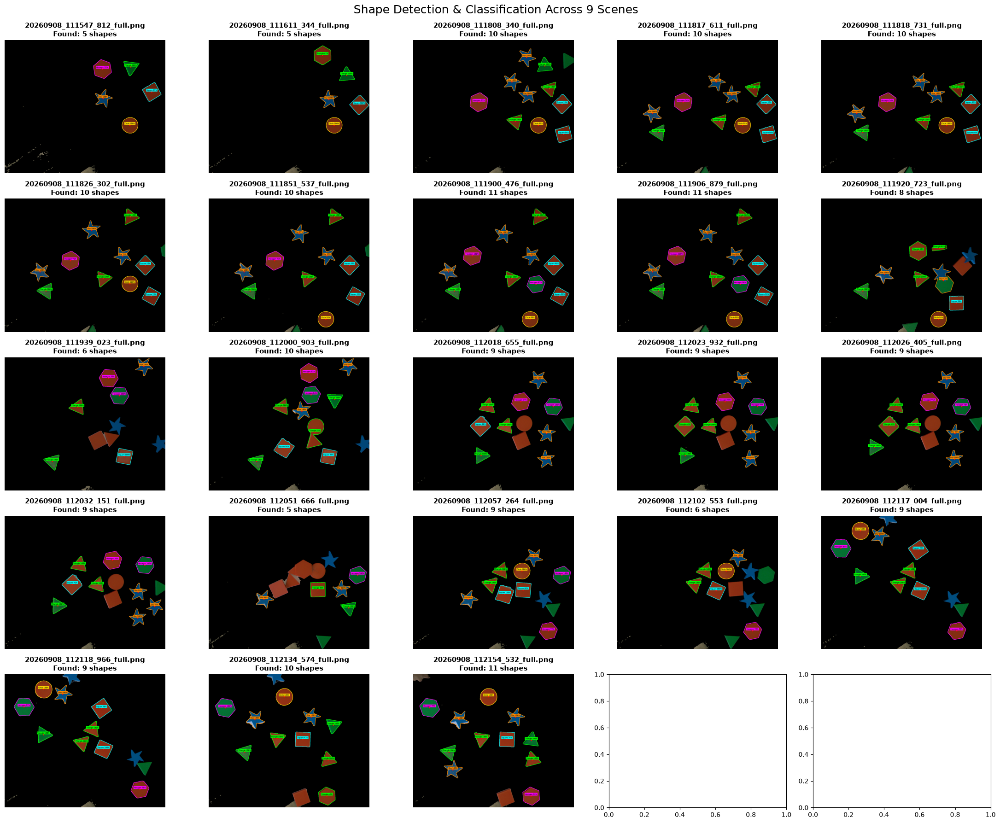

In [30]:
scene_paths = sorted(list(MASKED_DIR.glob("*.png")))[:23]

fig, axes = plt.subplots(5, 5, figsize=(22, 18))
axes = axes.flatten()

print(f"Processing {len(scene_paths)} test scenes...")

for i, scene_path in enumerate(scene_paths):
    annotated, dets = annotate_scene(str(scene_path), model)
    
    # Display in 3x3 grid
    axes[i].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f"{scene_path.name}\nFound: {len(dets)} shapes", fontsize=11, fontweight="bold")
    axes[i].axis("off")

plt.suptitle("Shape Detection & Classification Across 9 Scenes", fontsize=18, y=0.99)
plt.tight_layout()
plt.show()

Cordinates

In [31]:
DATASET_ROOT = Path(r"C:/Users/Nils/Downloads/dataset/dataset")
RAW_DIR      = DATASET_ROOT / "raw"

ARUCO_DICT = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_5X5_100)
ARUCO_PARAMS = cv2.aruco.DetectorParameters()

MARKER_SIZE_MM = 100.0

def detect_aruco_marker(img_bgr:np.ndarray):
    "detects 5x5 aruco marker"

    gray = cv2.cvtColor(img_bgr,cv2.COLOR_BGR2GRAY)

    if hasattr(cv2.aruco, "ArucoDetector"):
        detector = cv2.aruco.ArucoDetector(ARUCO_DICT, ARUCO_PARAMS)
        corner, ids, _ = detector.detectMarkers(gray)
    else:
        corner, ids, _ = cv2.aruco.detectMarkers(gray, ARUCO_DICT, parameters=ARUCO_PARAMS)

    if ids is None or len(ids) == 0:
        return None, None

    return corner[0].reshape(4, 2), int(ids.flatten()[0])




test_raw_path = str(list(RAW_DIR.glob("*.png"))[0])
raw_img = cv2.imread(test_raw_path)
marker_corners, marker_id = detect_aruco_marker(raw_img)
if marker_corners is not None:
    print(f"Found ArUco Marker ID: {marker_id}")
    print("Corner pixel coordinates [x, y]:")
    for i, pt in enumerate(marker_corners):
        print(f"  Corner {i} (TL, TR, BR, BL): [{pt[0]:.1f}, {pt[1]:.1f}]")
else:
    print("No marker detected — check dictionary or lighting")

Found ArUco Marker ID: 0
Corner pixel coordinates [x, y]:
  Corner 0 (TL, TR, BR, BL): [1495.0, 1585.0]
  Corner 1 (TL, TR, BR, BL): [1108.0, 1850.0]
  Corner 2 (TL, TR, BR, BL): [850.0, 1469.0]
  Corner 3 (TL, TR, BR, BL): [1247.0, 1201.0]


In [32]:
def compute_aruco_homography(marker_corners: np.ndarray, marker_size_mm: float = 100.0):
    """
    Calculates the 3x3 Homography matrix that converts pixels -> real-world mm.
    Origin (0, 0) mm is at the Top-Left corner of the marker.
    """
    # 1. Real-world coordinates of the 4 corners in millimeters (TL, TR, BR, BL)
    world_corners_mm = np.array([
        [0.0,            0.0],            # Corner 0: Top-Left (Origin)
        [marker_size_mm, 0.0],            # Corner 1: Top-Right (X-axis)
        [marker_size_mm, marker_size_mm], # Corner 2: Bottom-Right
        [0.0,            marker_size_mm], # Corner 3: Bottom-Left (Y-axis)
    ], dtype=np.float32)

    # 2. Pixel coordinates detected by OpenCV
    pixel_corners = marker_corners.astype(np.float32)

    # 3. Find 3x3 Homography Matrix: pixels -> mm
    H_px_to_mm, _ = cv2.findHomography(pixel_corners, world_corners_mm)
    
    return H_px_to_mm


def pixel_to_mm(H_matrix: np.ndarray, px: float, py: float) -> tuple[float, float]:
    """Applies the homography matrix to convert any (px, py) to (X_mm, Y_mm)."""
    pt_px = np.array([px, py, 1.0], dtype=np.float32)
    pt_mm = H_matrix @ pt_px
    
    # Normalize by the scale factor (w)
    x_mm = pt_mm[0] / pt_mm[2]
    y_mm = pt_mm[1] / pt_mm[2]
    
    return round(float(x_mm), 1), round(float(y_mm), 1)


# ── Sanity Check: Test on the Marker's Own Corners ───────────────────────────
H_matrix = compute_aruco_homography(marker_corners, MARKER_SIZE_MM)

print("Sanity Check on ArUco Marker Corners:")
print("-" * 45)
for i, pt in enumerate(marker_corners):
    x_mm, y_mm = pixel_to_mm(H_matrix, pt[0], pt[1])
    print(f"Corner {i} pixel [{pt[0]:.1f}, {pt[1]:.1f}]  -->  Real World: ({x_mm:5.1f} mm, {y_mm:5.1f} mm)")

Sanity Check on ArUco Marker Corners:
---------------------------------------------
Corner 0 pixel [1495.0, 1585.0]  -->  Real World: ( -0.0 mm,  -0.0 mm)
Corner 1 pixel [1108.0, 1850.0]  -->  Real World: (100.0 mm,  -0.0 mm)
Corner 2 pixel [850.0, 1469.0]  -->  Real World: (100.0 mm, 100.0 mm)
Corner 3 pixel [1247.0, 1201.0]  -->  Real World: ( -0.0 mm, 100.0 mm)


=== Robotic Pick & Place Targets (20260908_111547_812_full.png) ===
Origin (0, 0) mm is at ArUco Marker ID 0 Top-Left Corner

#   | Class      | Confidence | Pixel (cx, cy)   | Robot (X, Y) [mm]
-----------------------------------------------------------------
1   | Circle     |  99.6%     | ( 963,  654) px    | ( -11.9,  227.7) mm
2   | Star       | 100.0%     | ( 757,  449) px    | (   0.7,  284.7) mm
3   | Square     |  98.6%     | (1131,  398) px    | ( -69.2,  252.2) mm
4   | Triangle   | 100.0%     | ( 970,  206) px    | ( -62.1,  301.8) mm
5   | Hexagon    |  99.4%     | ( 751,  222) px    | ( -23.0,  322.6) mm


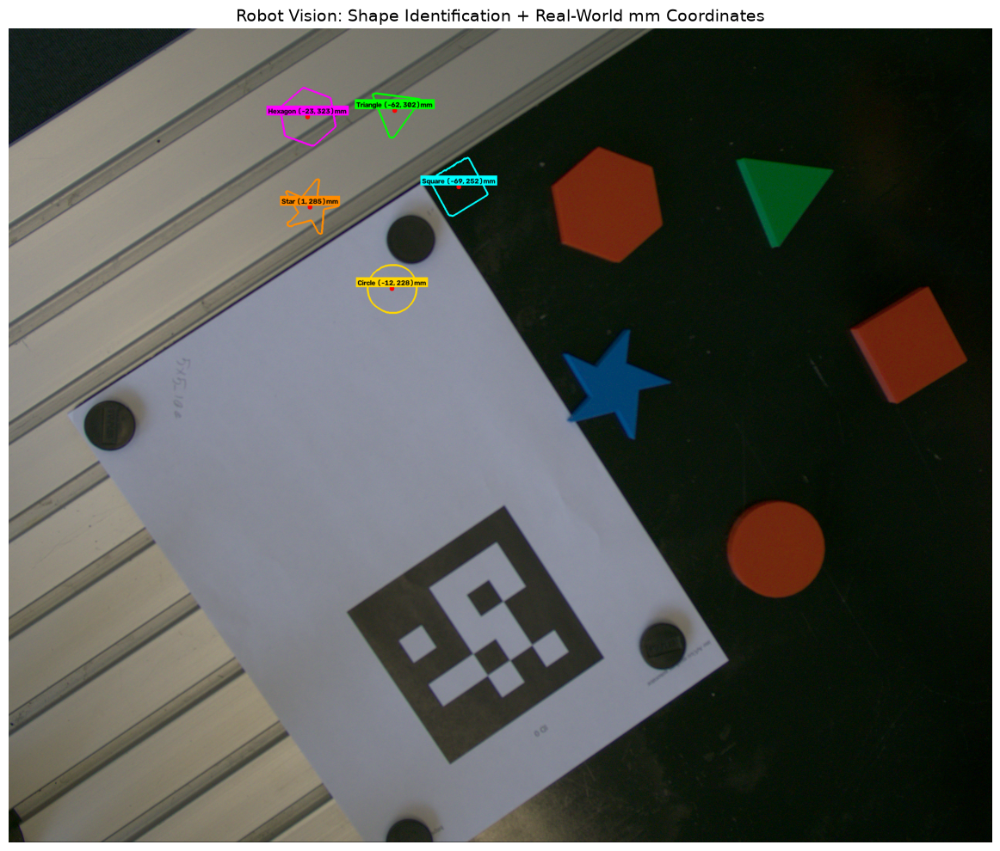

In [33]:
# ── Test Combined Pipeline on First Scene ─────────────────────────────────────
scene_filename = Path(test_raw_path).name
masked_scene_path = str(MASKED_DIR / scene_filename)

raw_img    = cv2.imread(test_raw_path)
masked_img = cv2.imread(masked_scene_path)

# 1. Detect ArUco marker on raw image to get Homography H
marker_corners, marker_id = detect_aruco_marker(raw_img)
H_matrix = compute_aruco_homography(marker_corners, MARKER_SIZE_MM)

# 2. Detect all shapes on the masked scene
regions = detect_shape_regions(masked_img)

annotated = raw_img.copy()
results = []

print(f"=== Robotic Pick & Place Targets ({scene_filename}) ===")
print(f"Origin (0, 0) mm is at ArUco Marker ID {marker_id} Top-Left Corner\n")
print(f"{'#':<3} | {'Class':<10} | {'Confidence':<10} | {'Pixel (cx, cy)':<16} | {'Robot (X, Y) [mm]'}")
print("-" * 65)

for i, region in enumerate(regions):
    roi = region["roi"]
    class_name, conf = classify_roi(roi, model)
    cx, cy = region["centroid"]
    
    # 3. CONVERT PIXELS TO REAL-WORLD MILLIMETERS!
    x_mm, y_mm = pixel_to_mm(H_matrix, cx, cy)
    
    # Draw on the raw image:
    color = CLASS_COLORS.get(class_name, (0, 255, 0))
    cv2.drawContours(annotated, [region["contour"]], -1, color, 3)
    cv2.circle(annotated, (cx, cy), 6, (0, 0, 255), -1)  # Target point

    # Draw coordinate label badge
    badge_text = f"{class_name} ({x_mm:.0f}, {y_mm:.0f})mm"
    (tw, th), _ = cv2.getTextSize(badge_text, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
    cv2.rectangle(annotated, (cx - tw//2 - 4, cy - th - 12), (cx + tw//2 + 4, cy - 4), color, -1)
    cv2.putText(annotated, badge_text, (cx - tw//2, cy - 8), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 2, cv2.LINE_AA)

    results.append({
        "class": class_name,
        "confidence": conf,
        "centroid_px": (cx, cy),
        "target_mm": (x_mm, y_mm),
    })
    
    print(f"{i+1:<3} | {class_name:<10} | {conf*100:5.1f}%     | ({cx:4d}, {cy:4d}) px    | ({x_mm:6.1f}, {y_mm:6.1f}) mm")

# 4. Display annotated raw scene
plt.figure(figsize=(14, 10))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.title("Robot Vision: Shape Identification + Real-World mm Coordinates", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

Resolution Scale: raw=2472x2048 vs masked=1236x1024
Scale Factor    : Sx=2.00, Sy=2.00

=== Robotic Pick & Place Targets (20260908_111547_812_full.png) ===
#   | Class      | Confidence | Raw (cx, cy)     | Robot (X, Y) [mm]
-----------------------------------------------------------------
1   | Circle     |  99.6%     | (1926, 1308) px  | (-110.9,   -3.4) mm
2   | Star       | 100.0%     | (1514,  898) px  | ( -81.8,  121.8) mm
3   | Square     |  98.6%     | (2262,  796) px  | (-231.5,   48.9) mm
4   | Triangle   | 100.0%     | (1940,  412) px  | (-213.0,  157.2) mm
5   | Hexagon    |  99.4%     | (1502,  444) px  | (-129.7,  202.5) mm


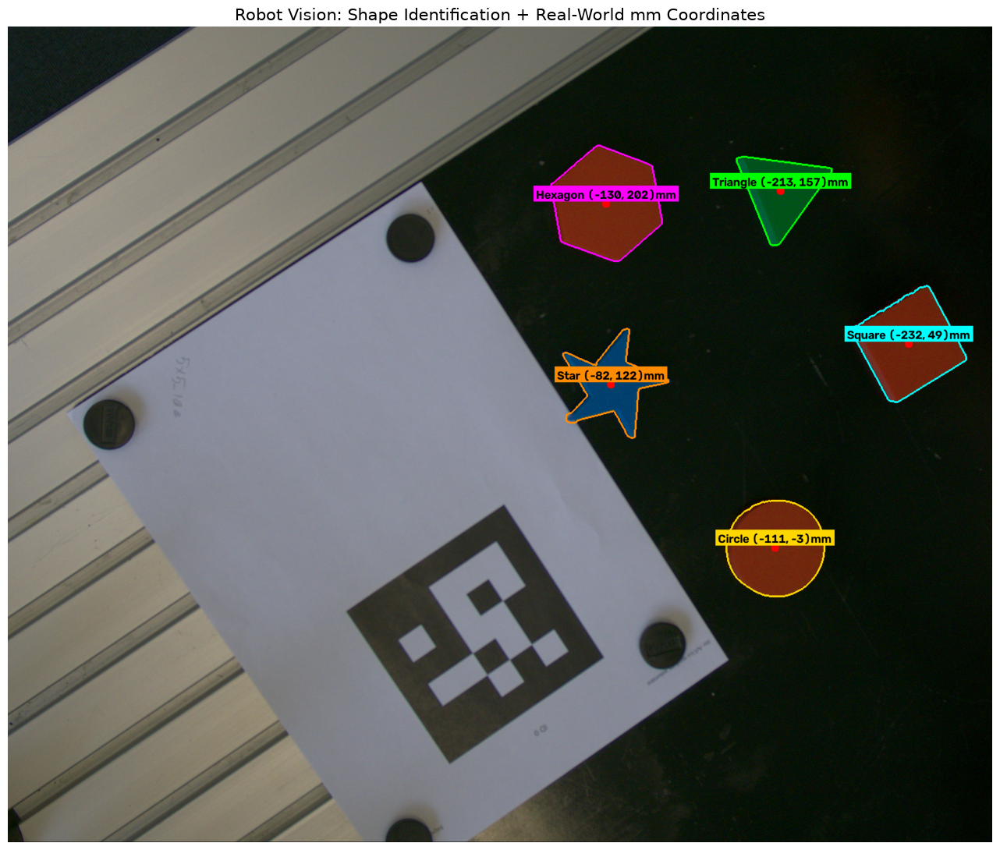

In [ ]:

scene_filename    = Path(test_raw_path).name
masked_scene_path = str(MASKED_DIR / scene_filename)

raw_img    = cv2.imread(test_raw_path)
masked_img = cv2.imread(masked_scene_path)

# 1. Detect ArUco marker on the RAW image to get Homography H
marker_corners, marker_id = detect_aruco_marker(raw_img)
H_matrix = compute_aruco_homography(marker_corners, MARKER_SIZE_MM)

# 2. Resolution scale factor (raw vs masked)
scale_x = raw_img.shape[1] / masked_img.shape[1]
scale_y = raw_img.shape[0] / masked_img.shape[0]
print(f"Resolution Scale: raw={raw_img.shape[1]}x{raw_img.shape[0]} vs masked={masked_img.shape[1]}x{masked_img.shape[0]}")
print(f"Scale Factor    : Sx={scale_x:.2f}, Sy={scale_y:.2f}\n")

# 3. Detect all shapes on the masked scene
regions = detect_shape_regions(masked_img)

annotated = raw_img.copy()
results = []

print(f"=== Robotic Pick & Place Targets ({scene_filename}) ===")
print(f"{'#':<3} | {'Class':<10} | {'Confidence':<10} | {'Raw (cx, cy)':<16} | {'Robot (X, Y) [mm]'}")
print("-" * 65)

for i, region in enumerate(regions):
    roi = region["roi"]
    class_name, conf = classify_roi(roi, model)
    
    # Scale centroid from masked resolution -> raw resolution!
    cx_raw = int(region["centroid"][0] * scale_x)
    cy_raw = int(region["centroid"][1] * scale_y)
    
    # Scale contour points for drawing on raw image
    contour_raw = (region["contour"] * [scale_x, scale_y]).astype(np.int32)
    
    # 4. CONVERT RAW PIXELS TO REAL-WORLD MILLIMETERS!
    x_mm, y_mm = pixel_to_mm(H_matrix, cx_raw, cy_raw)
    
    color = CLASS_COLORS.get(class_name, (0, 255, 0))
    cv2.drawContours(annotated, [contour_raw], -1, color, 4)
    cv2.circle(annotated, (cx_raw, cy_raw), 10, (0, 0, 255), -1)  # Target point

    # Draw coordinate label badge
    badge_text = f"{class_name} ({x_mm:.0f}, {y_mm:.0f})mm"
    (tw, th), _ = cv2.getTextSize(badge_text, cv2.FONT_HERSHEY_SIMPLEX, 1.0, 2)
    cv2.rectangle(annotated, (cx_raw - tw//2 - 6, cy_raw - th - 18), (cx_raw + tw//2 + 6, cy_raw - 6), color, -1)
    cv2.putText(annotated, badge_text, (cx_raw - tw//2, cy_raw - 12), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 0), 2, cv2.LINE_AA)

    results.append({
        "class": class_name,
        "confidence": conf,
        "centroid_raw_px": (cx_raw, cy_raw),
        "target_mm": (x_mm, y_mm),
    })
    
    print(f"{i+1:<3} | {class_name:<10} | {conf*100:5.1f}%     | ({cx_raw:4d}, {cy_raw:4d}) px  | ({x_mm:6.1f}, {y_mm:6.1f}) mm")

# 5. Display annotated raw scene
plt.figure(figsize=(15, 11))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.title("Robot Vision: Shape Identification + Real-World mm Coordinates", fontsize=15)
plt.axis("off")
plt.tight_layout()
plt.show()

=== Shape Orientation & Coordinates ===
Class      | Robot (X, Y) [mm]    | Angle (deg) 
--------------------------------------------------
Circle     | (-110.9,   -3.4) mm       |    0.0°
Star       | ( -81.8,  121.8) mm       |   87.2°
Square     | (-231.5,   48.9) mm       |  -28.6°
Triangle   | (-213.0,  157.2) mm       |    7.4°
Hexagon    | (-129.7,  202.5) mm       |  -40.3°


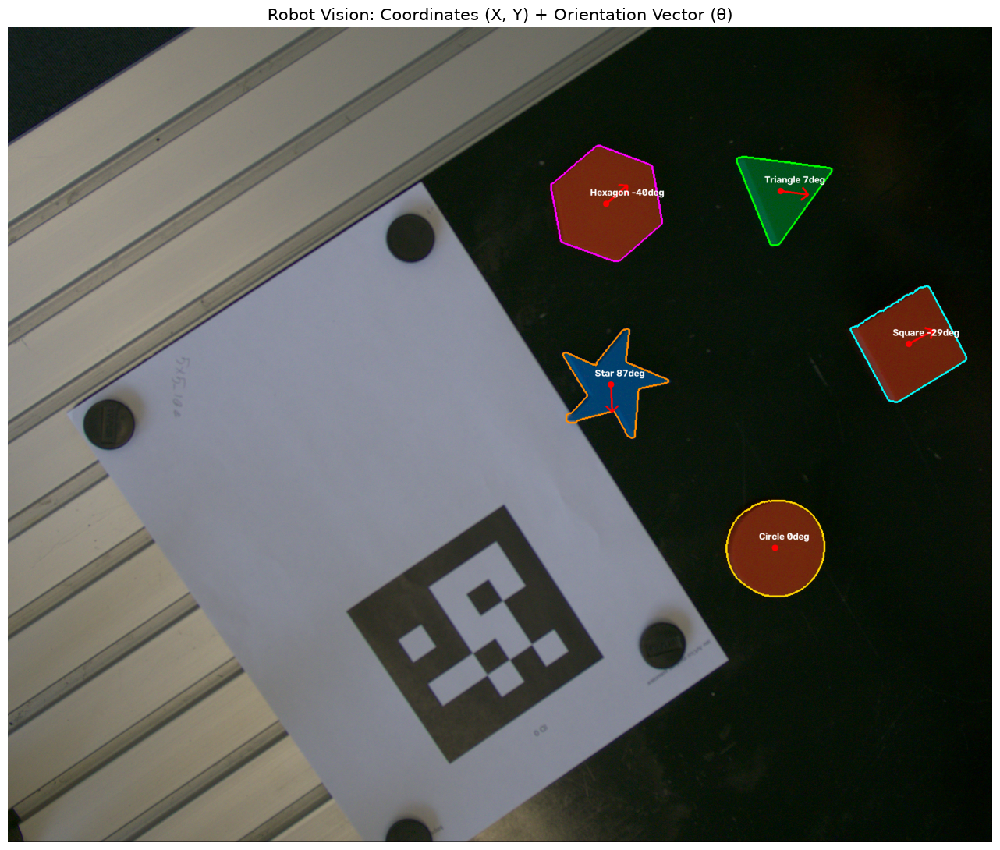

In [35]:
def get_shape_orientation(contour: np.ndarray, shape_class: str) -> float:
    """
    Calculates the orientation angle (in degrees) of a shape contour.
    Returns angle in degrees (-180 to +180).
    """
    # For a circle, rotation is meaningless (0 degrees)
    if shape_class == "Circle":
        return 0.0

    # Method: Minimum Area Rotated Box
    rect = cv2.minAreaRect(contour)
    (cx, cy), (w, h), angle = rect

    # OpenCV minAreaRect convention adjustments
    if w < h:
        angle = angle + 90.0
        
    # Map to [-90, +90]
    while angle > 90:
        angle -= 180
    while angle <= -90:
        angle += 180

    return round(float(angle), 1)


# ── Test & Draw Orientation Arrows on the Raw Image ───────────────────────────
annotated_rot = raw_img.copy()

print("=== Shape Orientation & Coordinates ===")
print(f"{'Class':<10} | {'Robot (X, Y) [mm]':<20} | {'Angle (deg)':<12}")
print("-" * 50)

for region in regions:
    cnt = region["contour"]
    roi = region["roi"]
    class_name, _ = classify_roi(roi, model)
    
    cx_raw = int(region["centroid"][0] * scale_x)
    cy_raw = int(region["centroid"][1] * scale_y)
    contour_raw = (cnt * [scale_x, scale_y]).astype(np.int32)
    
    # 1. Compute Coordinates
    x_mm, y_mm = pixel_to_mm(H_matrix, cx_raw, cy_raw)
    
    # 2. Compute Angle
    angle_deg = get_shape_orientation(cnt, class_name)
    
    # 3. Draw orientation arrow (pointing along the angle)
    color = CLASS_COLORS.get(class_name, (0, 255, 0))
    cv2.drawContours(annotated_rot, [contour_raw], -1, color, 3)
    cv2.circle(annotated_rot, (cx_raw, cy_raw), 8, (0, 0, 255), -1)

    if class_name != "Circle":
        rad = np.radians(angle_deg)
        arrow_len = 70  # pixels
        arrow_end = (int(cx_raw + arrow_len * np.cos(rad)), 
                     int(cy_raw + arrow_len * np.sin(rad)))
        cv2.arrowedLine(annotated_rot, (cx_raw, cy_raw), arrow_end, (0, 0, 255), 3, tipLength=0.3)

    # Text badge with coordinates + angle
    badge = f"{class_name} {angle_deg:.0f}deg"
    cv2.putText(annotated_rot, badge, (cx_raw - 40, cy_raw - 20), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2, cv2.LINE_AA)
    
    print(f"{class_name:<10} | ({x_mm:6.1f}, {y_mm:6.1f}) mm       | {angle_deg:6.1f}°")

plt.figure(figsize=(15, 11))
plt.imshow(cv2.cvtColor(annotated_rot, cv2.COLOR_BGR2RGB))
plt.title("Robot Vision: Coordinates (X, Y) + Orientation Vector (θ)", fontsize=15)
plt.axis("off")
plt.tight_layout()
plt.show()

=== Robot Placement Orientation Commands ===
Shape      | Angle on Table   | Robot Wrist Correction
-------------------------------------------------------
Circle     |    0.0°           | Rotate wrist   -0.0°
Star       |   87.2°           | Rotate wrist  -87.2°
Square     |  -28.6°           | Rotate wrist   28.6°
Triangle   |    7.4°           | Rotate wrist   -7.4°
Hexagon    |  -40.3°           | Rotate wrist   40.3°


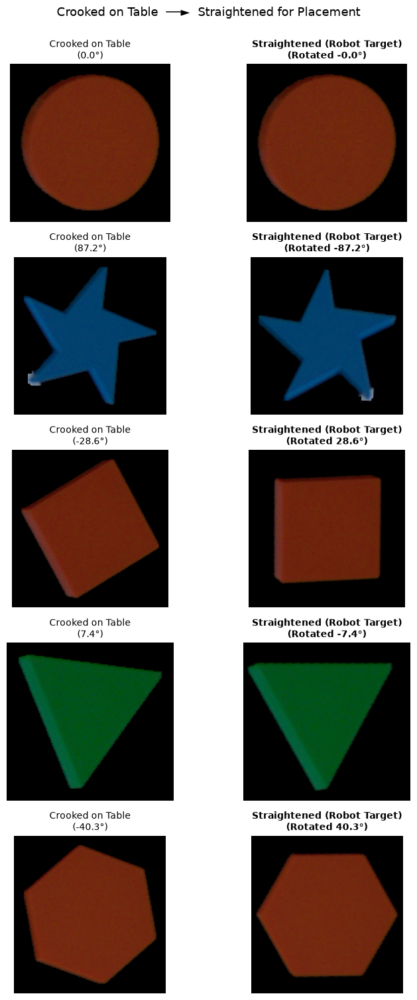

In [36]:
def straighten_shape(roi_bgr: np.ndarray, angle_deg: float) -> np.ndarray:
    """Rotates a shape crop by -angle_deg so it sits perfectly upright."""
    if abs(angle_deg) < 0.5:
        return roi_bgr
        
    h, w = roi_bgr.shape[:2]
    center = (w // 2, h // 2)
    
    # 2D rotation matrix around center
    M = cv2.getRotationMatrix2D(center, angle_deg, 1.0)
    
    # Warp image with black border
    straight = cv2.warpAffine(roi_bgr, M, (w, h), borderMode=cv2.BORDER_CONSTANT, borderValue=(0,0,0))
    return straight


# ── Create Side-by-Side Gallery: Crooked vs Straightened ───────────────────────
n = len(regions)
fig, axes = plt.subplots(n, 2, figsize=(8, 3 * n))

print("=== Robot Placement Orientation Commands ===")
print(f"{'Shape':<10} | {'Angle on Table':<16} | {'Robot Wrist Correction':<22}")
print("-" * 55)

for i, region in enumerate(regions):
    roi = region["roi"]
    cnt = region["contour"]
    class_name, _ = classify_roi(roi, model)
    
    # Calculate angle
    angle_deg = get_shape_orientation(cnt, class_name)
    
    # Straighten the shape!
    straight_roi = straighten_shape(roi, angle_deg)
    
    # Plot original on table
    axes[i, 0].imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title(f"Crooked on Table\n({angle_deg:.1f}°)", fontsize=10)
    axes[i, 0].axis("off")
    
    # Plot straightened for robot
    axes[i, 1].imshow(cv2.cvtColor(straight_roi, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title(f"Straightened (Robot Target)\n(Rotated {-angle_deg:.1f}°)", fontsize=10, fontweight="bold")
    axes[i, 1].axis("off")
    
    print(f"{class_name:<10} | {angle_deg:6.1f}°           | Rotate wrist {-angle_deg:6.1f}°")

plt.suptitle("Crooked on Table  ──►  Straightened for Placement", fontsize=13, y=1.0)
plt.tight_layout()
plt.show()

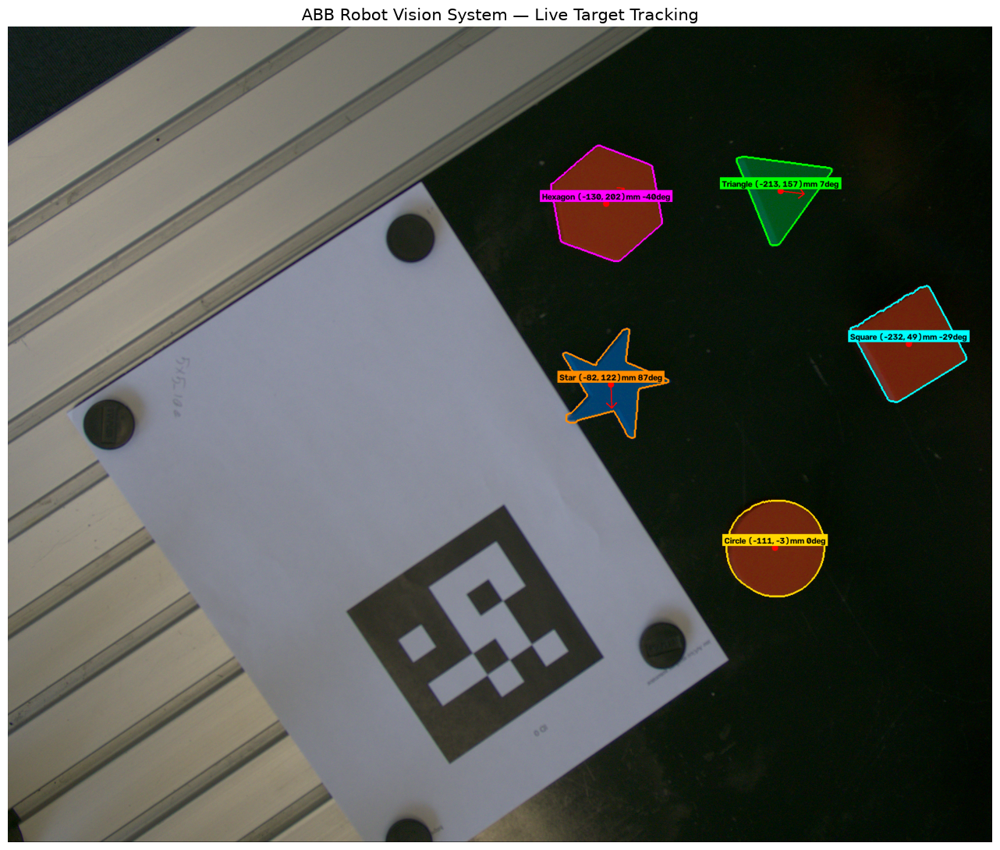


=== Data Packet Ready for ABB Robot Controller ===
[
  {
    "shape": "Circle",
    "confidence": 0.996,
    "x_mm": -110.9,
    "y_mm": -3.4,
    "rotation_deg": 0.0,
    "wrist_turn_deg": -0.0
  },
  {
    "shape": "Star",
    "confidence": 1.0,
    "x_mm": -81.8,
    "y_mm": 121.8,
    "rotation_deg": 87.2,
    "wrist_turn_deg": -87.2
  },
  {
    "shape": "Square",
    "confidence": 0.986,
    "x_mm": -231.5,
    "y_mm": 48.9,
    "rotation_deg": -28.6,
    "wrist_turn_deg": 28.6
  },
  {
    "shape": "Triangle",
    "confidence": 1.0,
    "x_mm": -213.0,
    "y_mm": 157.2,
    "rotation_deg": 7.4,
    "wrist_turn_deg": -7.4
  },
  {
    "shape": "Hexagon",
    "confidence": 0.994,
    "x_mm": -129.7,
    "y_mm": 202.5,
    "rotation_deg": -40.3,
    "wrist_turn_deg": 40.3
  }
]


In [37]:
def robot_vision_pipeline(
    raw_img_path: str,
    model: nn.Module,
    masked_img_path: str = None,
    marker_size_mm: float = 100.0,
    confidence_thresh: float = 0.70
):
    """
    ONE UNIFIED PIPELINE:
    Input  : Single scene photo from overhead camera
    Output : (annotated_image, robot_commands_list)
    """
    raw_img = cv2.imread(raw_img_path)
    if raw_img is None:
        raise FileNotFoundError(f"Cannot load {raw_img_path}")

    # 1. Calibrate World Plane from ArUco Marker
    marker_corners, marker_id = detect_aruco_marker(raw_img)
    if marker_corners is None:
        print("⚠️ Warning: No ArUco marker detected! Cannot compute mm coordinates.")
        return raw_img, []

    H_matrix = compute_aruco_homography(marker_corners, marker_size_mm)

    # 2. Shape Detection (using matching masked frame or raw)
    if masked_img_path and Path(masked_img_path).exists():
        detect_src = cv2.imread(masked_img_path)
        scale_x = raw_img.shape[1] / detect_src.shape[1]
        scale_y = raw_img.shape[0] / detect_src.shape[0]
    else:
        detect_src = raw_img
        scale_x, scale_y = 1.0, 1.0

    regions = detect_shape_regions(detect_src)

    annotated = raw_img.copy()
    robot_commands = []

    # 3. Process each shape
    for region in regions:
        roi = region["roi"]
        class_name, conf = classify_roi(roi, model)

        # Quality Control: Ignore low-confidence anomalies
        if conf < confidence_thresh:
            continue

        # Coordinate transformation
        cx_raw = int(region["centroid"][0] * scale_x)
        cy_raw = int(region["centroid"][1] * scale_y)
        contour_raw = (region["contour"] * [scale_x, scale_y]).astype(np.int32)
        
        x_mm, y_mm = pixel_to_mm(H_matrix, cx_raw, cy_raw)
        angle_deg  = get_shape_orientation(region["contour"], class_name)
        wrist_turn = round(-angle_deg, 1)

        # Store robot command
        robot_commands.append({
            "shape": class_name,
            "confidence": round(conf, 3),
            "x_mm": x_mm,
            "y_mm": y_mm,
            "rotation_deg": angle_deg,
            "wrist_turn_deg": wrist_turn,
        })

        # 4. Draw HUD on Raw Image
        color = CLASS_COLORS.get(class_name, (0, 255, 0))
        cv2.drawContours(annotated, [contour_raw], -1, color, 3)
        cv2.circle(annotated, (cx_raw, cy_raw), 8, (0, 0, 255), -1)  # Suction center

        # Draw orientation vector
        if class_name != "Circle":
            rad = np.radians(angle_deg)
            arrow_end = (int(cx_raw + 60 * np.cos(rad)), int(cy_raw + 60 * np.sin(rad)))
            cv2.arrowedLine(annotated, (cx_raw, cy_raw), arrow_end, (0, 0, 255), 2, tipLength=0.3)

        # Draw Info Badge: Shape, Coordinates, Rotation
        badge = f"{class_name} ({x_mm:.0f}, {y_mm:.0f})mm {angle_deg:.0f}deg"
        (tw, th), _ = cv2.getTextSize(badge, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)
        cv2.rectangle(annotated, (cx_raw - tw//2 - 5, cy_raw - th - 15), (cx_raw + tw//2 + 5, cy_raw - 5), color, -1)
        cv2.putText(annotated, badge, (cx_raw - tw//2, cy_raw - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2, cv2.LINE_AA)

    return annotated, robot_commands


# ── Run the Unified System on a Test Scene ─────────────────────────────────────
test_raw   = str(list(RAW_DIR.glob("*.png"))[0])
test_mask  = str(MASKED_DIR / Path(test_raw).name)

annotated_img, robot_payload = robot_vision_pipeline(
    raw_img_path=test_raw, 
    model=model, 
    masked_img_path=test_mask
)

# Display Visual Overlay
plt.figure(figsize=(15, 11))
plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
plt.title("ABB Robot Vision System — Live Target Tracking", fontsize=15)
plt.axis("off")
plt.tight_layout()
plt.show()

# Print Clean Robot Packet
print("\n=== Data Packet Ready for ABB Robot Controller ===")
import json
print(json.dumps(robot_payload, indent=2))

In [38]:
class MultiHeadShapeNet(nn.Module):
    """
    Multi-Task Neural Network with 3 Output Heads:
      1. Class Head: Shape classification (5 classes)
      2. Angle Head: Rotation orientation [sin(θ), cos(θ)]
      3. BBox Head : Width & Height dimensions [w, h]
    """
    def __init__(self, num_classes: int = 5):
        super().__init__()
        weights = MobileNet_V3_Small_Weights.IMAGENET1K_V1
        base = mobilenet_v3_small(weights=weights)
        
        # Shared Feature Extractor (Backbone)
        self.features = base.features
        self.pool = nn.AdaptiveAvgPool2d(1)
        
        in_features = 576  # MobileNetV3-Small pooled feature size

        # ── HEAD 1: Classification (Cross-Entropy) ────────────────────────────
        self.class_head = nn.Sequential(
            nn.Linear(in_features, 128),
            nn.Hardswish(),
            nn.Dropout(0.2),
            nn.Linear(128, num_classes)
        )

        # ── HEAD 2: Orientation Angle [sin(θ), cos(θ)] (Regression) ───────────
        self.angle_head = nn.Sequential(
            nn.Linear(in_features, 64),
            nn.Hardswish(),
            nn.Linear(64, 2)  # outputs [sin(theta), cos(theta)]
        )

        # ── HEAD 3: Bounding Dimension [w, h] (Regression) ────────────────────
        self.box_head = nn.Sequential(
            nn.Linear(in_features, 64),
            nn.Hardswish(),
            nn.Linear(64, 2)  # outputs [w_norm, h_norm]
        )

    def forward(self, x):
        # 1. Pass through shared backbone
        feat = self.features(x)
        feat = self.pool(feat)
        feat = torch.flatten(feat, 1)

        # 2. Branch into the 3 heads
        logits = self.class_head(feat)
        sin_cos = self.angle_head(feat)
        box = self.box_head(feat)

        return logits, sin_cos, box

In [39]:
# ── Load labels.csv ───────────────────────────────────────────────────────────
df_labels = pd.read_csv(LABELS_CSV)

# Filter for only our 5 valid classes
df_clean = df_labels[df_labels["shape"].isin(VALID_CLASSES)].copy()

# Keep only rows where the image file actually exists on disk (handles hand-pruned files)
valid_rows = []
for idx, row in df_clean.iterrows():
    full_path = DATASET_ROOT / row["object_masked_path"]
    if full_path.exists():
        valid_rows.append(row)

df_clean = pd.DataFrame(valid_rows).reset_index(drop=True)
print(f"Loaded {len(df_clean)} valid multi-task samples from labels.csv")


class MultiTaskShapeDataset(Dataset):
    """Feeds (image, class_label, [sin_theta, cos_theta], [w, h])"""
    def __init__(self, df: pd.DataFrame, transform=None):
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = str(DATASET_ROOT / row["object_masked_path"])
        
        img_bgr = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        
        if self.transform:
            img_rgb = self.transform(img_rgb)

        # Target 1: Class (int)
        class_target = torch.tensor(CLASS_TO_IDX[row["shape"]], dtype=torch.long)

        # Target 2: Rotation angle -> [sin(theta), cos(theta)]
        theta_rad = np.radians(float(row["rotation_deg"]))
        sin_cos_target = torch.tensor([np.sin(theta_rad), np.cos(theta_rad)], dtype=torch.float32)

        # Target 3: Normalized Bounding Box [w, h]
        w_norm = float(row["bbox_w"]) / 200.0  # normalize roughly to [0, 1]
        h_norm = float(row["bbox_h"]) / 200.0
        box_target = torch.tensor([w_norm, h_norm], dtype=torch.float32)

        return img_rgb, class_target, sin_cos_target, box_target


# ── Train / Val Split (80 / 20) ───────────────────────────────────────────────
train_df, val_df = train_test_split(df_clean, test_size=0.20, random_state=42, stratify=df_clean["shape"])

mt_train_dataset = MultiTaskShapeDataset(train_df, transform=train_transform)
mt_val_dataset   = MultiTaskShapeDataset(val_df,   transform=val_transform)

mt_train_loader = DataLoader(mt_train_dataset, batch_size=16, shuffle=True,  num_workers=0)
mt_val_loader   = DataLoader(mt_val_dataset,   batch_size=16, shuffle=False, num_workers=0)

# Quick Sanity Check: Peek at 1 batch
b_imgs, b_cls, b_ang, b_box = next(iter(mt_train_loader))
print(f"Batch images : {b_imgs.shape}")
print(f"Batch classes: {b_cls[:4].tolist()}  -> {[IDX_TO_CLASS[i] for i in b_cls[:4].tolist()]}")
print(f"Batch [sin,cos] target sample:\n{b_ang[:2]}")
print(f"Batch [w,h] box target sample:\n{b_box[:2]}")

Loaded 190 valid multi-task samples from labels.csv
Batch images : torch.Size([16, 3, 128, 128])
Batch classes: [2, 0, 3, 4]  -> ['Square', 'Circle', 'Star', 'Triangle']
Batch [sin,cos] target sample:
tensor([[0.0889, 0.9960],
        [0.0000, 1.0000]])
Batch [w,h] box target sample:
tensor([[0.6150, 0.5950],
        [0.6350, 0.6250]])


In [42]:
# ── Instantiate Multi-Head Model on RTX 4070 ──────────────────────────────────
mt_model = MultiHeadShapeNet(num_classes=len(classes))
mt_model = mt_model.to(DEVICE)

# Loss functions
criterion_class = nn.CrossEntropyLoss()
criterion_angle = nn.MSELoss()
criterion_box   = nn.MSELoss()

# Optimizer
optimizer = optim.Adam(mt_model.parameters(), lr=5e-4)


def run_multitask_epoch(model, loader, is_train: bool):
    model.train() if is_train else model.eval()
    
    total_loss = 0.0
    correct_cls, total_samples = 0, 0
    angle_errors = []

    ctx = torch.enable_grad() if is_train else torch.no_grad()
    with ctx:
        for imgs, cls_targets, ang_targets, box_targets in loader:
            imgs        = imgs.to(DEVICE)
            cls_targets = cls_targets.to(DEVICE)
            ang_targets = ang_targets.to(DEVICE)
            box_targets = box_targets.to(DEVICE)

            if is_train:
                optimizer.zero_grad()

            # Forward pass through all 3 heads
            pred_logits, pred_ang, pred_box = model(imgs)

            # Calculate individual losses
            loss_c = criterion_class(pred_logits, cls_targets)
            loss_a = criterion_angle(pred_ang, ang_targets)
            loss_b = criterion_box(pred_box, box_targets)

            # Combined Multi-Task Loss
            total_batch_loss = loss_c + 2.0 * loss_a + loss_b

            if is_train:
                total_batch_loss.backward()
                optimizer.step()

            total_loss += total_batch_loss.item() * imgs.size(0)
            
            # Metrics: Classification accuracy
            preds = pred_logits.argmax(dim=1)
            correct_cls += (preds == cls_targets).sum().item()
            total_samples += imgs.size(0)

            p_np = pred_ang.detach().cpu().numpy()
            t_np = ang_targets.cpu().numpy()
            pred_rad = np.arctan2(p_np[:, 0], p_np[:, 1])
            true_rad = np.arctan2(t_np[:, 0], t_np[:, 1])


            deg_diff = np.abs(np.degrees(pred_rad - true_rad))
            deg_diff = np.minimum(deg_diff, 360 - deg_diff)
            angle_errors.extend(deg_diff)

    avg_loss = total_loss / total_samples
    accuracy = correct_cls / total_samples
    avg_angle_err = np.mean(angle_errors)

    return avg_loss, accuracy, avg_angle_err


# ── Train Multi-Head Network for 20 Epochs ─────────────────────────────────────
print(f"Training Multi-Head Network (3 Heads) on {DEVICE}...")
print("-" * 65)

best_val_acc = 0.0

for epoch in range(1, 21):
    tr_loss, tr_acc, tr_a_err = run_multitask_epoch(mt_model, mt_train_loader, is_train=True)
    vl_loss, vl_acc, vl_a_err = run_multitask_epoch(mt_model, mt_val_loader,   is_train=False)

    saved = ""
    if vl_acc > best_val_acc:
        best_val_acc = vl_acc
        torch.save(mt_model.state_dict(), "best_multitask_shape_model.pth")
        saved = "(Saved best checkpoint!)"

    print(f"Epoch [{epoch:02d}/20] | "
          f"Tr Acc: {tr_acc*100:5.1f}% | "
          f"Val Acc: {vl_acc*100:5.1f}% | "
          f"Val Angle Error: {vl_a_err:4.1f}° {saved}")

print("-" * 65)
print(f"Multi-Head Model Trained! Best Val Acc: {best_val_acc*100:.1f}%")

Training Multi-Head Network (3 Heads) on cuda...
-----------------------------------------------------------------
Epoch [01/20] | Tr Acc:  40.1% | Val Acc:  89.5% | Val Angle Error: 22.2° ⭐ (Saved best checkpoint!)
Epoch [02/20] | Tr Acc:  88.2% | Val Acc:  89.5% | Val Angle Error: 21.1° 
Epoch [03/20] | Tr Acc:  95.4% | Val Acc:  92.1% | Val Angle Error: 20.0° ⭐ (Saved best checkpoint!)
Epoch [04/20] | Tr Acc:  98.0% | Val Acc:  97.4% | Val Angle Error: 17.5° ⭐ (Saved best checkpoint!)
Epoch [05/20] | Tr Acc:  97.4% | Val Acc:  92.1% | Val Angle Error: 18.5° 
Epoch [06/20] | Tr Acc:  98.0% | Val Acc: 100.0% | Val Angle Error: 18.1° ⭐ (Saved best checkpoint!)
Epoch [07/20] | Tr Acc: 100.0% | Val Acc: 100.0% | Val Angle Error: 18.2° 
Epoch [08/20] | Tr Acc: 100.0% | Val Acc: 100.0% | Val Angle Error: 19.5° 
Epoch [09/20] | Tr Acc: 100.0% | Val Acc: 100.0% | Val Angle Error: 17.9° 
Epoch [10/20] | Tr Acc:  97.4% | Val Acc: 100.0% | Val Angle Error: 19.0° 
Epoch [11/20] | Tr Acc:  99.3% 

=== Multi-Head AI Inference on 20260908_111547_812_full.png ===
#   | Class (Head 1)  | AI Angle (Head 2)  | Robot (X, Y) [mm]
--------------------------------------------------------------
1   | Circle          (97.4%) |    0.0°            | (-110.9,   -3.4) mm
2   | Star            (91.7%) |   49.7°            | ( -81.8,  121.8) mm
3   | Square          (99.4%) |   38.7°            | (-231.5,   48.9) mm
4   | Triangle        (99.8%) |   28.2°            | (-213.0,  157.2) mm
5   | Hexagon         (99.6%) |   18.7°            | (-129.7,  202.5) mm


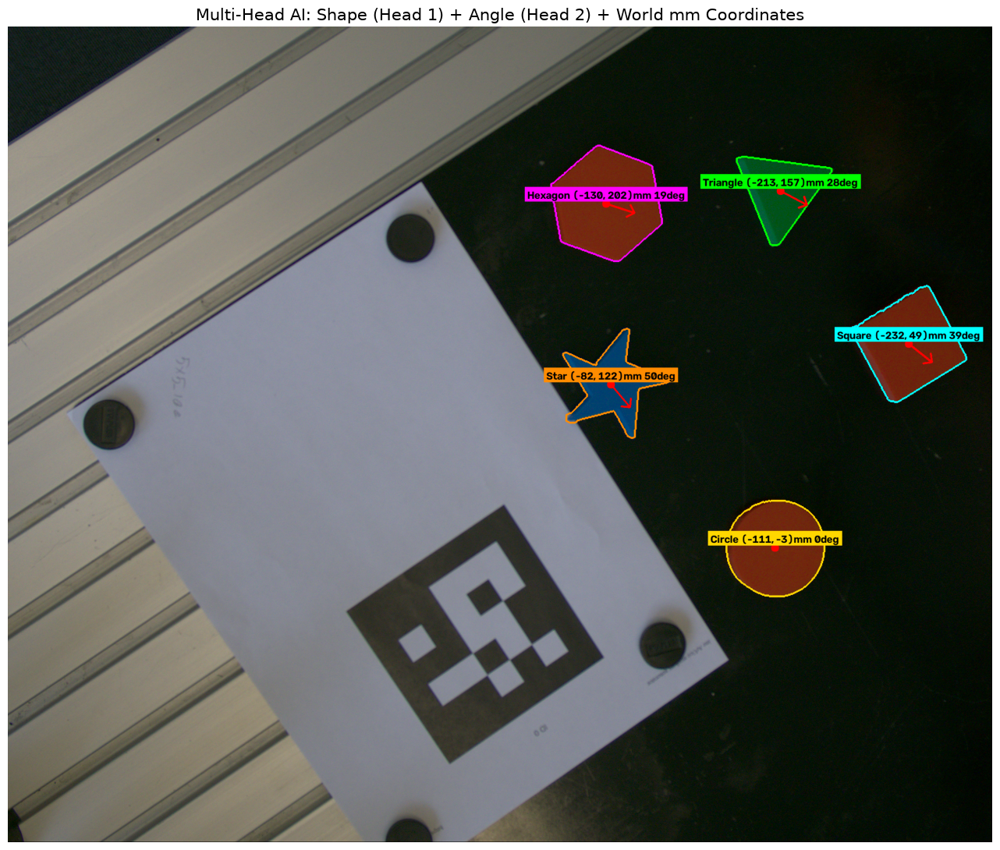

In [ ]:
#  Load Best Multi-Head Model Weights 
mt_model.load_state_dict(torch.load("best_multitask_shape_model.pth", map_location=DEVICE))
mt_model.eval()

# Pick test scene
test_raw_file = str(list(RAW_DIR.glob("*.png"))[0])
test_mask_file = str(MASKED_DIR / Path(test_raw_file).name)

raw_img  = cv2.imread(test_raw_file)
mask_img = cv2.imread(test_mask_file)

# 1. ArUco Homography
marker_corners, marker_id = detect_aruco_marker(raw_img)
H_matrix = compute_aruco_homography(marker_corners, MARKER_SIZE_MM)

# 2. Scale factor & shape detection
scale_x = raw_img.shape[1] / mask_img.shape[1]
scale_y = raw_img.shape[0] / mask_img.shape[0]
regions = detect_shape_regions(mask_img)

annotated_mt = raw_img.copy()

print(f"=== Multi-Head AI Inference on {Path(test_raw_file).name} ===")
print(f"{'#':<3} | {'Class (Head 1)':<15} | {'AI Angle (Head 2)':<18} | {'Robot (X, Y) [mm]'}")
print("-" * 62)

with torch.no_grad():
    for i, region in enumerate(regions):
        roi = region["roi"]
        
        # Prepare ROI tensor for the Multi-Head model
        roi_rgb = cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)
        tensor_in = val_transform(roi_rgb).unsqueeze(0).to(DEVICE)
        
        # RUN MULTI-HEAD NEURAL NETWORK
        pred_logits, pred_ang, pred_box = mt_model(tensor_in)
        
        # Head 1: Class
        probs = torch.softmax(pred_logits, dim=1)[0]
        pred_idx = probs.argmax().item()
        class_name = IDX_TO_CLASS[pred_idx]
        conf = probs[pred_idx].item()
        
        # Head 2: Orientation Angle from [sin(theta), cos(theta)]
        sin_val = pred_ang[0, 0].item()
        cos_val = pred_ang[0, 1].item()
        ai_angle_deg = np.degrees(np.arctan2(sin_val, cos_val))
        
        # Circle has no orientation
        if class_name == "Circle":
            ai_angle_deg = 0.0

        # Coordinates
        cx_raw = int(region["centroid"][0] * scale_x)
        cy_raw = int(region["centroid"][1] * scale_y)
        x_mm, y_mm = pixel_to_mm(H_matrix, cx_raw, cy_raw)
        
        contour_raw = (region["contour"] * [scale_x, scale_y]).astype(np.int32)
        color = CLASS_COLORS.get(class_name, (0, 255, 0))

        # Draw contour and centroid
        cv2.drawContours(annotated_mt, [contour_raw], -1, color, 4)
        cv2.circle(annotated_mt, (cx_raw, cy_raw), 10, (0, 0, 255), -1)

        # Draw AI-predicted Orientation Arrow from Head 2!
        if class_name != "Circle":
            rad = np.radians(ai_angle_deg)
            arrow_end = (int(cx_raw + 75 * np.cos(rad)), int(cy_raw + 75 * np.sin(rad)))
            cv2.arrowedLine(annotated_mt, (cx_raw, cy_raw), arrow_end, (0, 0, 255), 3, tipLength=0.3)

        # Badge: Class + Robot mm + AI Angle
        badge = f"{class_name} ({x_mm:.0f}, {y_mm:.0f})mm {ai_angle_deg:.0f}deg"
        (tw, th), _ = cv2.getTextSize(badge, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)
        cv2.rectangle(annotated_mt, (cx_raw - tw//2 - 6, cy_raw - th - 18), (cx_raw + tw//2 + 6, cy_raw - 6), color, -1)
        cv2.putText(annotated_mt, badge, (cx_raw - tw//2, cy_raw - 12), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 0), 2, cv2.LINE_AA)

        print(f"{i+1:<3} | {class_name:<15} ({conf*100:4.1f}%) | {ai_angle_deg:6.1f}°            | ({x_mm:6.1f}, {y_mm:6.1f}) mm")

plt.figure(figsize=(15, 11))
plt.imshow(cv2.cvtColor(annotated_mt, cv2.COLOR_BGR2RGB))
plt.title("Multi-Head AI: Shape (Head 1) + Angle (Head 2) + World mm Coordinates", fontsize=15)
plt.axis("off")
plt.tight_layout()
plt.show()